In [1]:
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings("ignore")

In [ ]:
import json
import numpy as np
import proplot as pplt

import warnings
warnings.filterwarnings("ignore")

COLORS = []
colors = pplt.Cycle('ggplot')
for color in colors:
    COLORS.append(color['color'])
colors = pplt.Cycle('default')
for color in colors:
    COLORS.append(color['color'])

COLORS[0], COLORS[1] = COLORS[1], COLORS[0]

    
pplt.rc['figure.facecolor'] = 'white'

RESULT_DIR = "../../mpcd_result/"
DATA_DIR    = "../../mpcd/result_1106/"
FIGURE_DIR = "../../mpcd_figure/"

with open('plot_style.json', 'r') as f:
    format_params = json.load(f)
    
MOMENTS    = np.array([0.1, 0.08, 0.06, 0.04, 0.030, 0.024, 0.018, 0.012, 
                    0.006, 0.003, 0.001, 0.0008, 0.0006, 0.0004])

def format_ax(ax):
    ax.format(**format_params)
    ax.tick_params(top=True, right=True, bottom=True, left=True, which='both')
    ax.minorticks_on()

In [ ]:
from cg_topo_solv.analysis.result import load_target, load_all_fit
from cg_topo_solv.plot.plot_graph import plot_graph

2025-08-04 15:07:29.055878: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-04 15:07:31.075824: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### active learning

In [7]:
idx_hi, idx_mid, idx_lo, curves, yy, ps = load_target(RESULT_DIR, verbose=False)

desc_all, ps_all, curve_all, shear_rate, graph_all = load_all_fit(RESULT_DIR, rerun=False)

format_params_update = {
    'xscale': 'log',
    'xlim': [5e-5, 5e-2],
    'ylim': [3.8, 5.4],
    'xticks': [1e-4, 1e-3, 1e-2],
    'yticks': [3.8, 4.2, 4.6, 5.0, 5.4],
    'xticklabels': [r'$10^{-4}$', r'$10^{-3}$', r'$10^{-2}$'],
    'xlabel': r'Shear Rate $\dot{\mathit{\gamma}}~[(\mathit{m}\mathit{\sigma}^2/\mathit{\epsilon})^{-1/2}]$',
    'ylabel': r'Shear Viscosity $\mathit{\eta}~[(\mathit{m}\mathit{\epsilon})^{1/2}/\mathit{\sigma}^2]$',
}

Loaded sampled latent space points from sample_z_mean_maximin_sampling.pickle


### active learning best polymers and viscosity curves

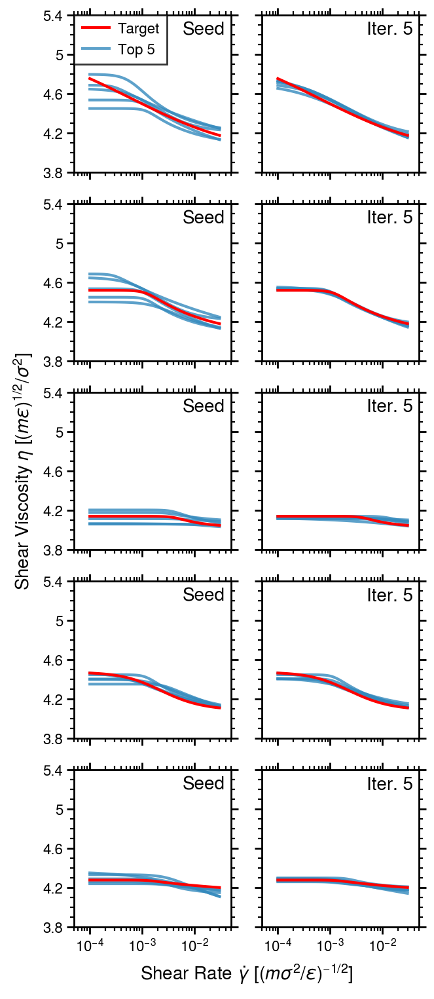

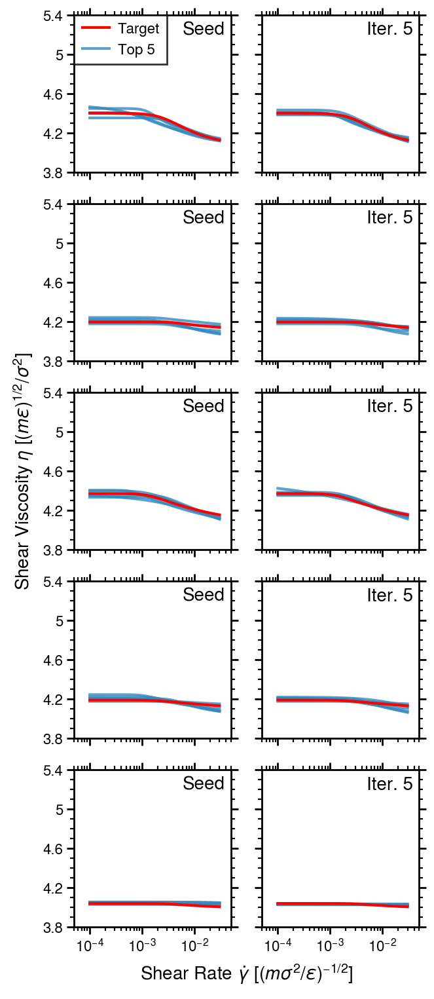

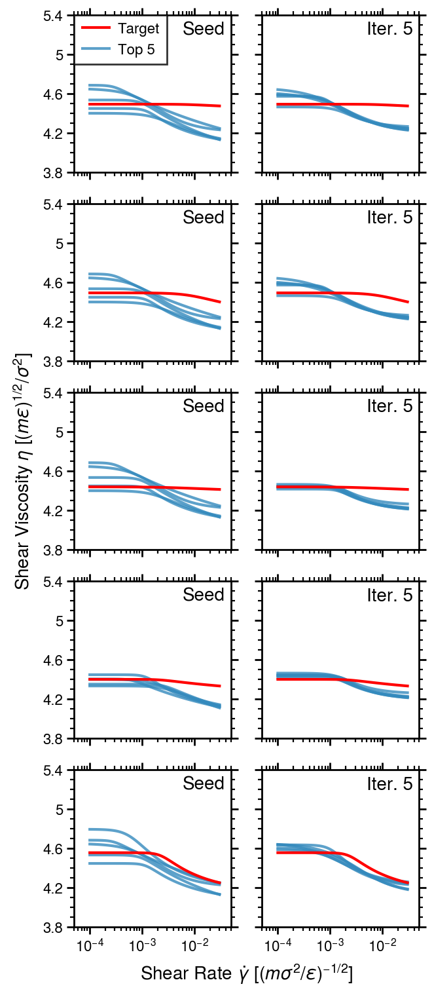

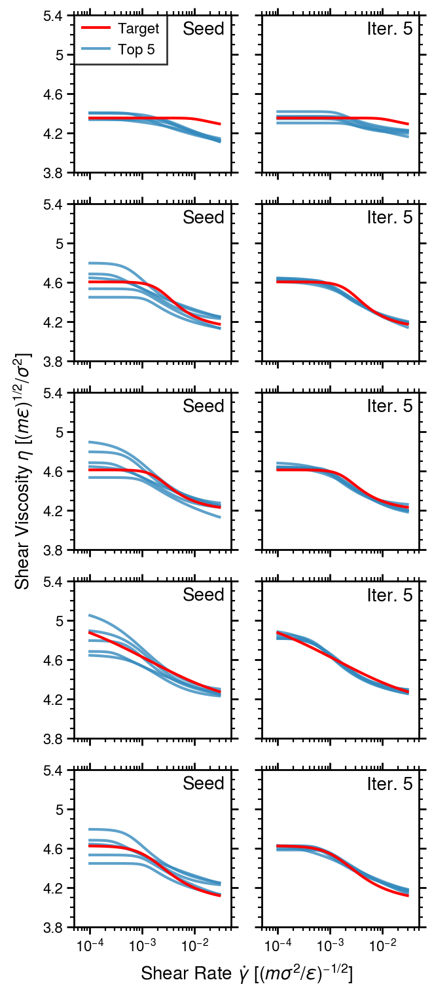

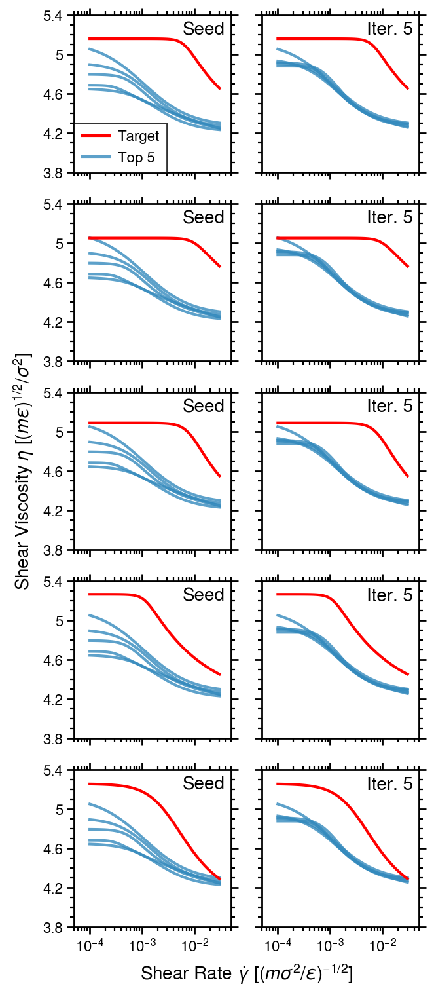

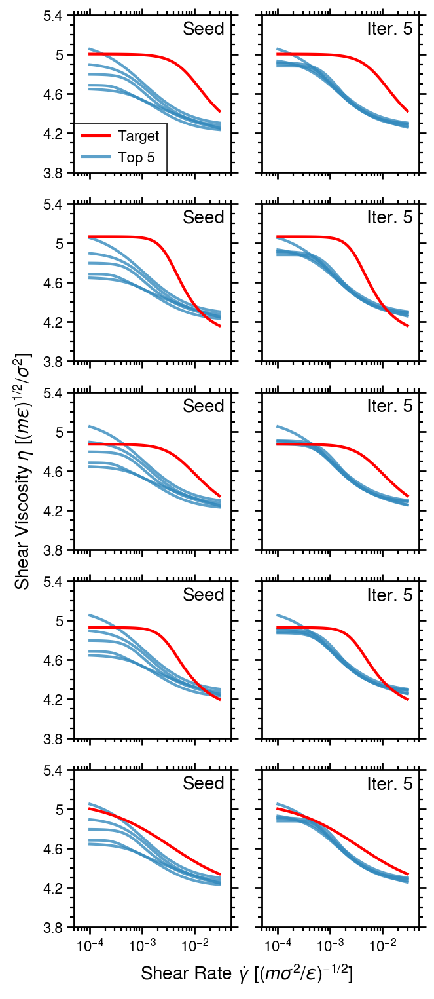

In [5]:
target_indices  = np.concatenate((idx_lo, idx_mid, idx_hi))
target_curves   = curves[target_indices]
explored_curves = np.concatenate((curve_all[:30], curve_all[-150:]))
explored_graphs = graph_all[:30] + graph_all[-150:]
explored_desc   = np.concatenate((desc_all[:30], desc_all[-150:]), axis=0)

mse_matrix = np.mean(np.square(explored_curves[None, :, :] - target_curves[:, None, :]), axis=2)

texts = ["Seed", "Iter. 5"]

for group_idx in range(6):
    fig, ax = pplt.subplots(ncols=2, nrows=5, refheight=1.2, share=True, refwidth=1.2)

    for target_idx in range(5):
        curve_idx = group_idx * 5 + target_idx

        for col in range(2):
            errors   = mse_matrix[curve_idx][:30] if col == 0 else mse_matrix[curve_idx]
            top5_idx = np.argsort(errors)[:5]
            plot_idx = col + target_idx * 2

            ax[plot_idx].plot(shear_rate[0], target_curves[curve_idx], 'r', zorder=3, alpha=1, label="Target")

            for j, idx in enumerate(top5_idx):
                alpha = 0.8
                label = "Top 5" if j == 0 else None
                ax[plot_idx].plot(shear_rate[0], explored_curves[idx], COLORS[0], zorder=2, alpha=alpha, label=label)

            ax[plot_idx].format(**format_params_update)
            format_ax(ax[plot_idx])

            if target_idx == 0 and col == 0:
                loc = 'upper left' if explored_curves[top5_idx].max() < 4.8 else "lower left"
                legend = ax[plot_idx].legend(loc=loc, ncols=1, prop={'size': 8})
                legend.get_frame().set_linewidth(1)

            ax[plot_idx].text(0.96, 0.96, texts[col], ha='right', va='top', transform=ax[plot_idx].transAxes, size=10)

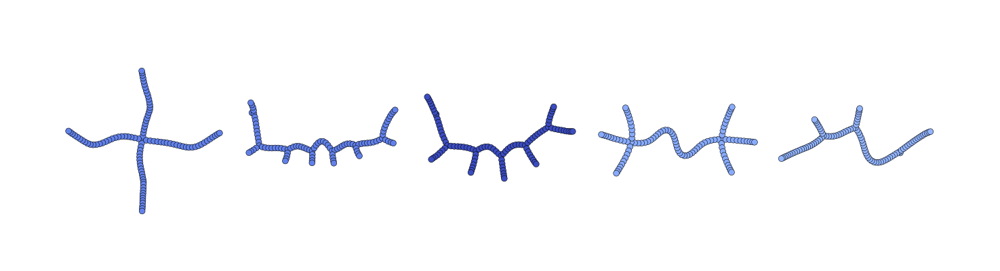

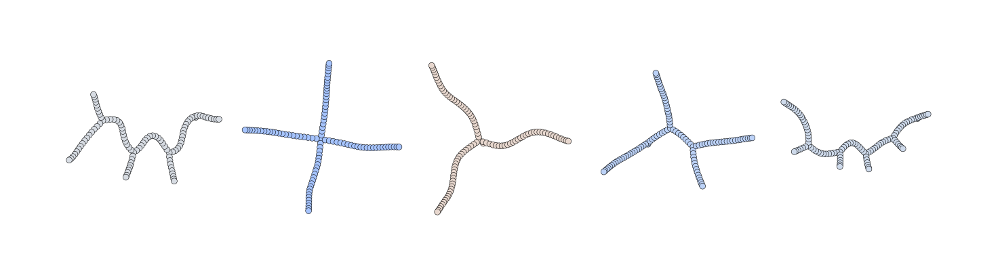

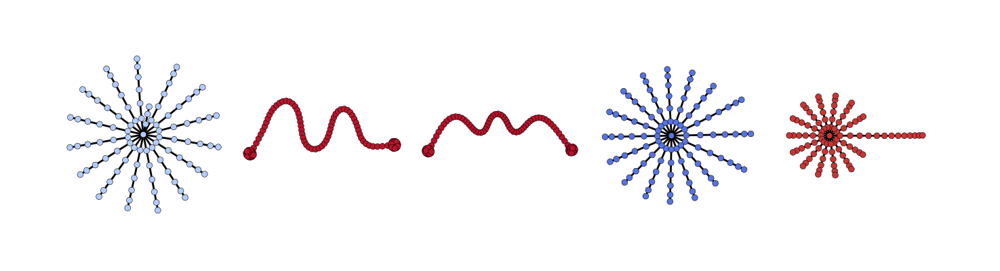

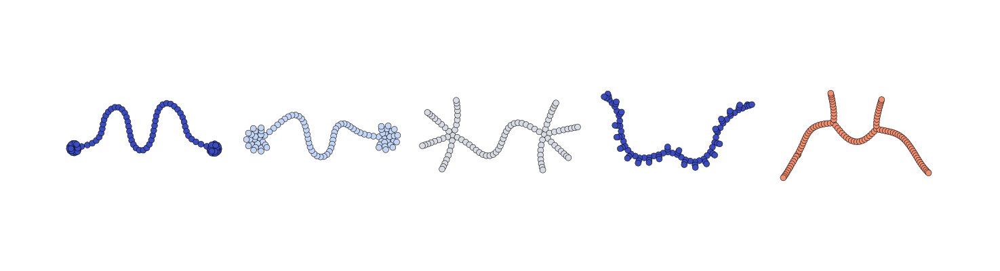

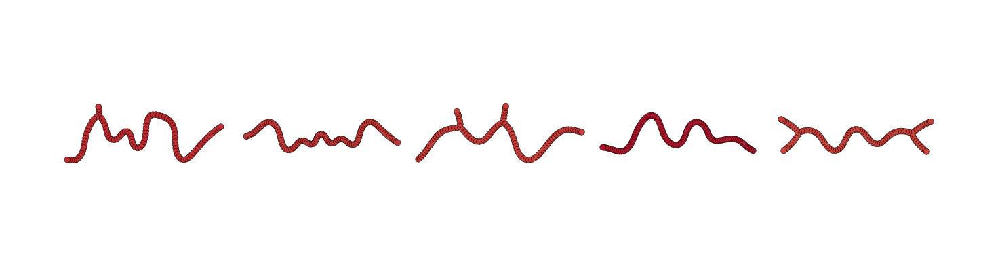

...

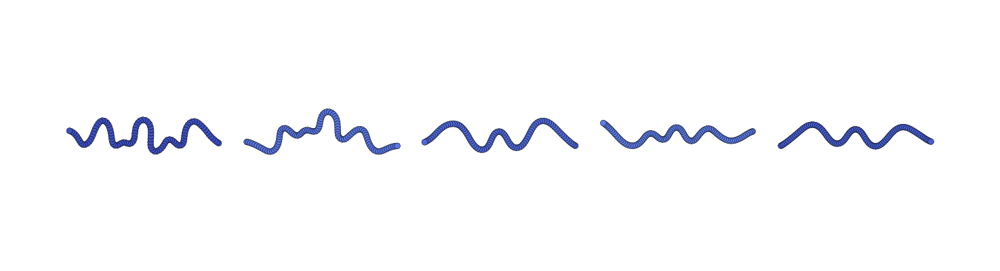

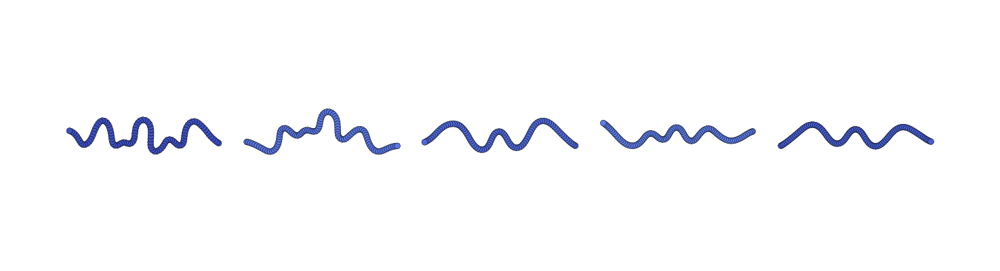

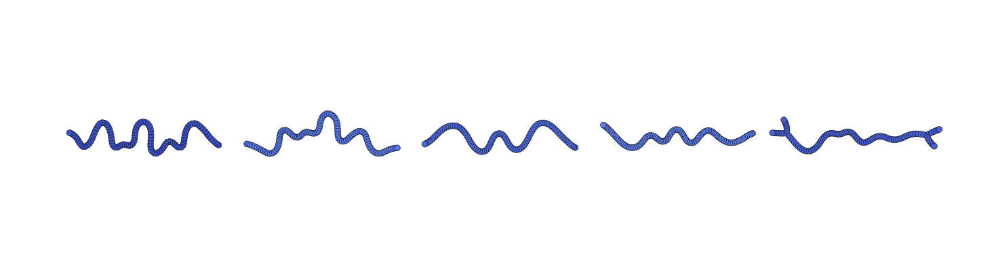

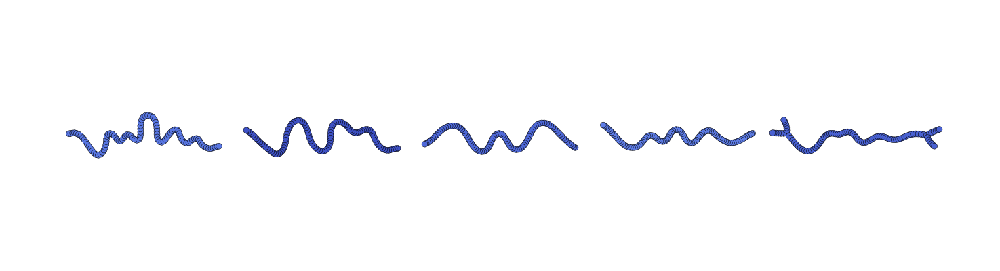

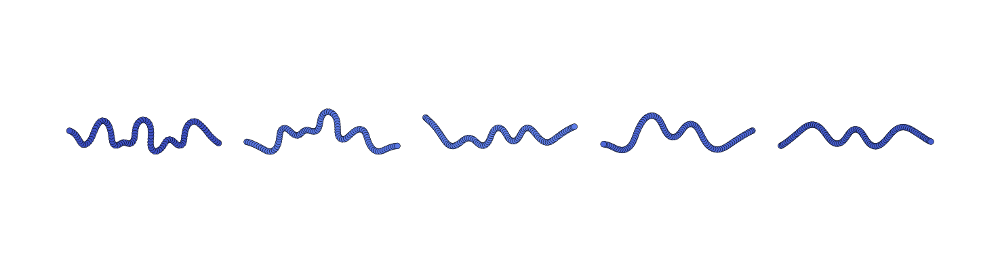

In [6]:
for target_idx in range(30):
    mse_vals  = mse_matrix[target_idx]
    top5_idx  = np.argsort(mse_vals)[:5]

    fig, ax = pplt.subplots(ncols=5, nrows=1, refheight=2, refwidth=2, wspace=-5.5, hspace=0)

    for i in range(5):
        np.random.seed(target_idx * 5 + i + 1)
        g = explored_graphs[top5_idx[i]]
        lam = explored_desc[top5_idx[i]][-1]
        plot_graph(g, ax[i], lam, iteration=100 * (i + 1), lw=0.2, seed=i)

### Space-filling

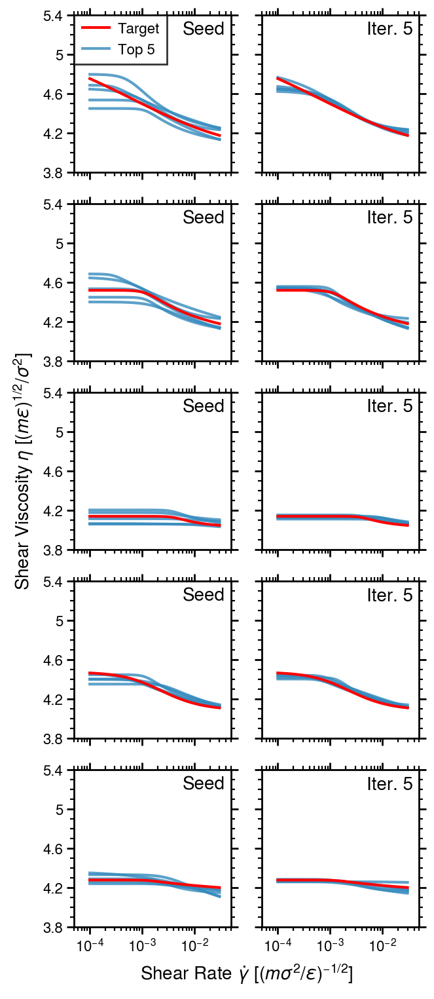

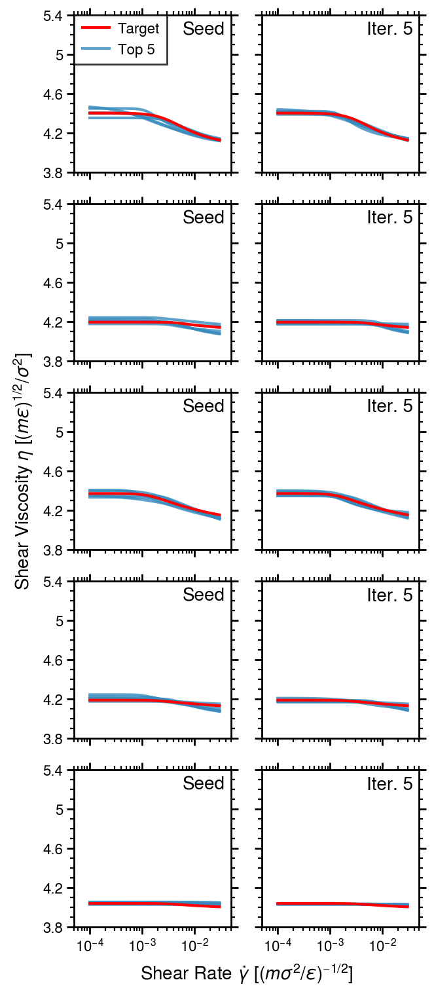

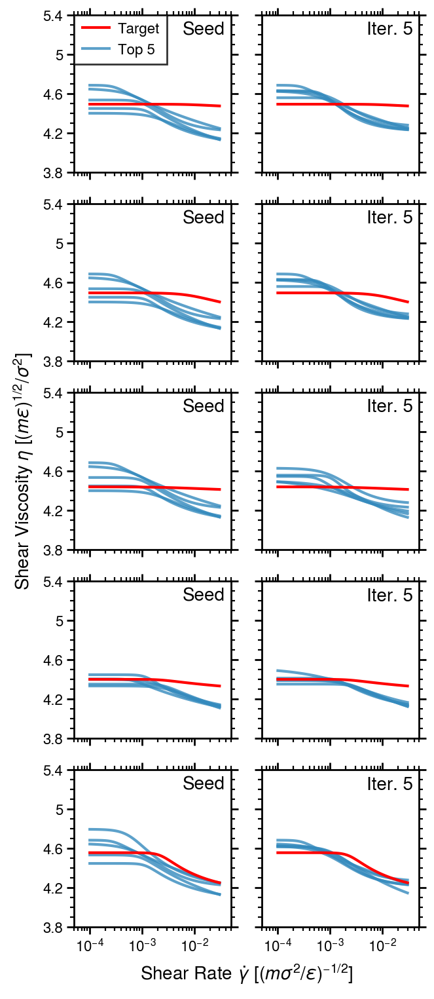

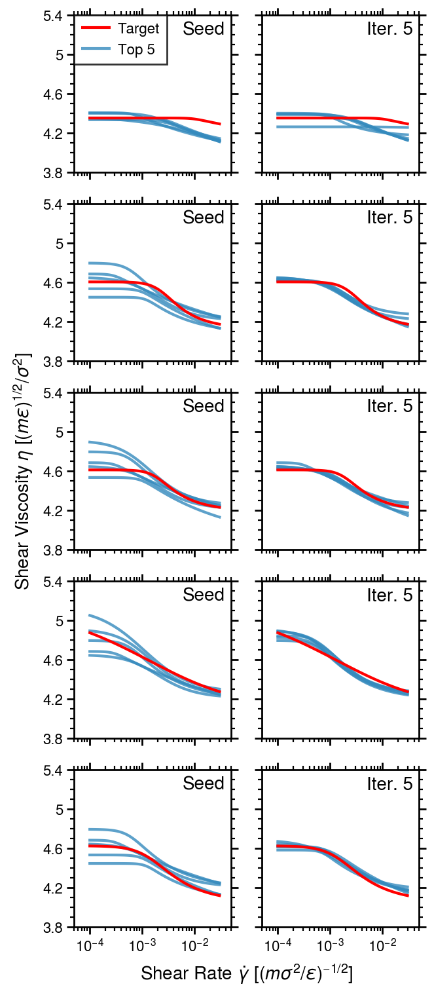

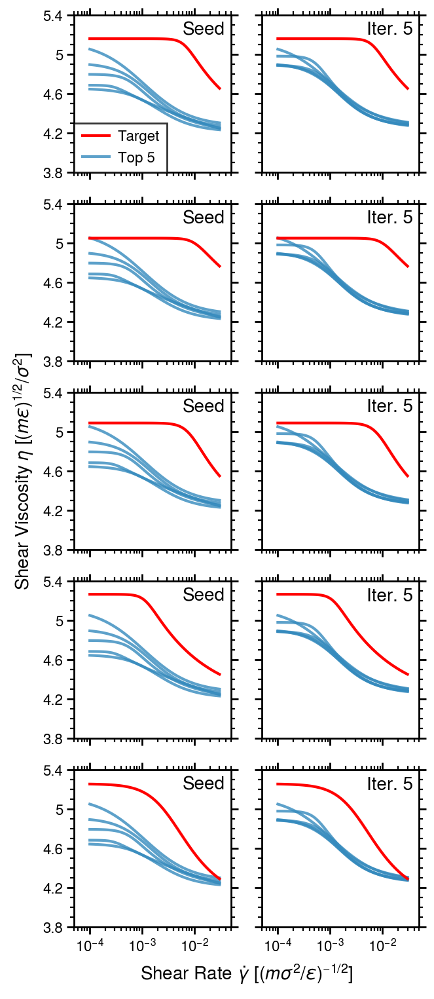

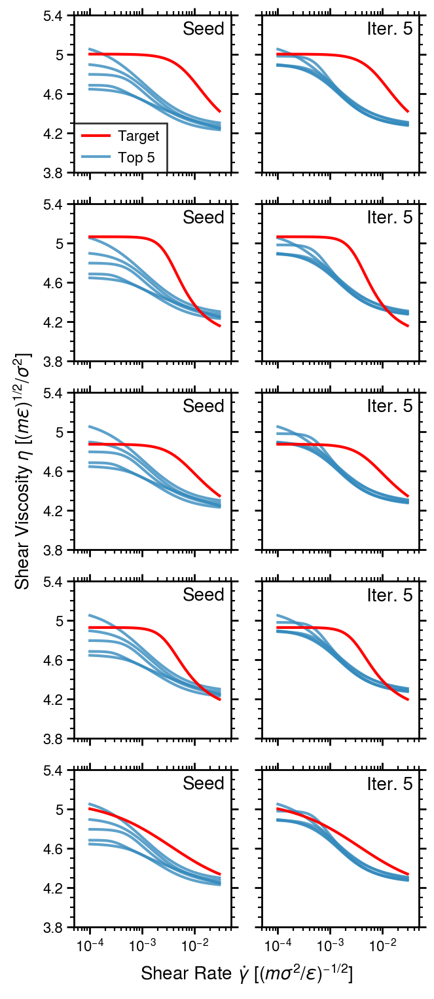

In [7]:
idx_hi, idx_mid, idx_lo, curves, yy, ps = load_target(RESULT_DIR, verbose=False)

desc_all, ps_all, curve_all, shear_rate, graph_all = load_all_fit(RESULT_DIR, rerun=False)

target_indices  = np.concatenate((idx_lo, idx_mid, idx_hi))
target_curves   = curves[target_indices]
explored_curves = np.concatenate((curve_all[:30], curve_all[-300:-150]))
explored_graphs = graph_all[:30] + graph_all[-300:-150]
explored_desc   = np.concatenate((desc_all[:30], desc_all[-300:-150]), axis=0)

mse_matrix = np.mean(np.square(explored_curves[None, :, :] - target_curves[:, None, :]), axis=2)

format_params_update = {
    'xscale': 'log',
    'xlim': [5e-5, 5e-2],
    'ylim': [3.8, 5.4],
    'xticks': [1e-4, 1e-3, 1e-2],
    'yticks': [3.8, 4.2, 4.6, 5.0, 5.4],
    'xticklabels': [r'$10^{-4}$', r'$10^{-3}$', r'$10^{-2}$'],
    'xlabel': r'Shear Rate $\dot{\mathit{\gamma}}~[(\mathit{m}\mathit{\sigma}^2/\mathit{\epsilon})^{-1/2}]$',
    'ylabel': r'Shear Viscosity $\mathit{\eta}~[(\mathit{m}\mathit{\epsilon})^{1/2}/\mathit{\sigma}^2]$',
}

texts = ["Seed", "Iter. 5"]

for group_idx in range(6):
    fig, ax = pplt.subplots(ncols=2, nrows=5, refheight=1.2, share=True, refwidth=1.2)

    for target_idx in range(5):
        curve_idx = group_idx * 5 + target_idx

        for col in range(2):
            errors   = mse_matrix[curve_idx][:30] if col == 0 else mse_matrix[curve_idx]
            top5_idx = np.argsort(errors)[:5]
            plot_idx = col + target_idx * 2

            ax[plot_idx].plot(shear_rate[0], target_curves[curve_idx], 'r', zorder=3, alpha=1, label="Target")

            for j, idx in enumerate(top5_idx):
                alpha = 0.8
                label = "Top 5" if j == 0 else None
                ax[plot_idx].plot(shear_rate[0], explored_curves[idx], COLORS[0], zorder=2, alpha=alpha, label=label)

            ax[plot_idx].format(**format_params_update)
            format_ax(ax[plot_idx])

            if target_idx == 0 and col == 0:
                loc = 'upper left' if explored_curves[top5_idx].max() < 4.8 else "lower left"
                legend = ax[plot_idx].legend(loc=loc, ncols=1, prop={'size': 8})
                legend.get_frame().set_linewidth(1)

            ax[plot_idx].text(0.96, 0.96, texts[col], ha='right', va='top', transform=ax[plot_idx].transAxes, size=10)

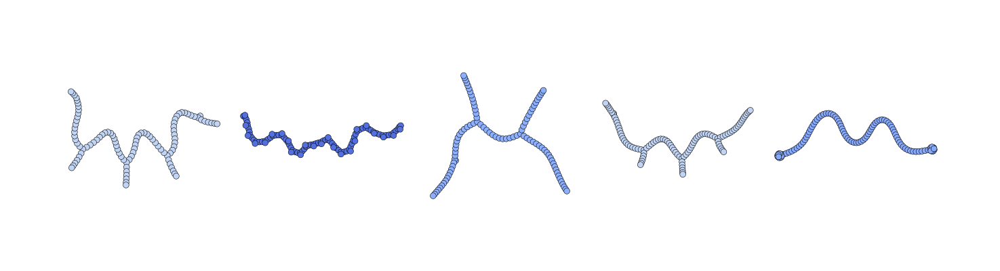

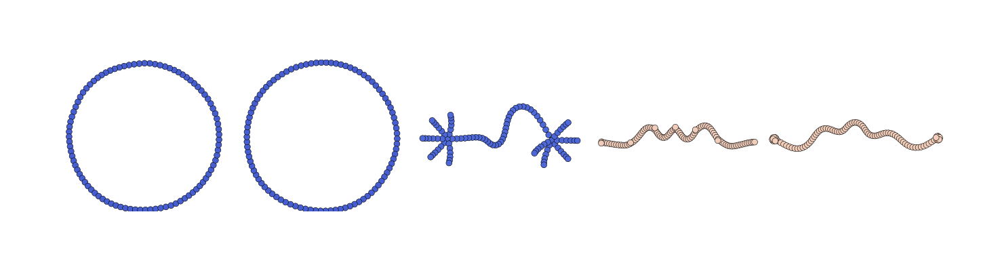

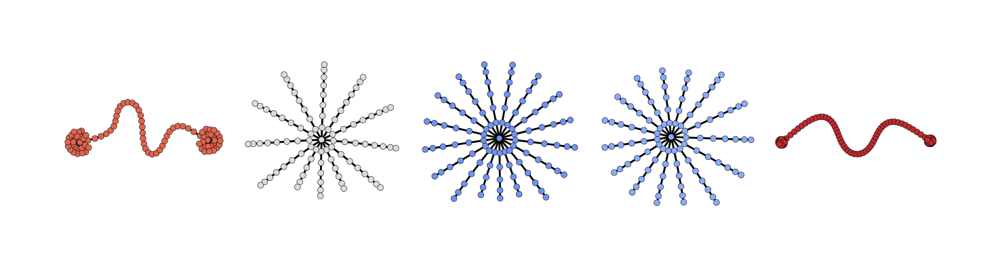

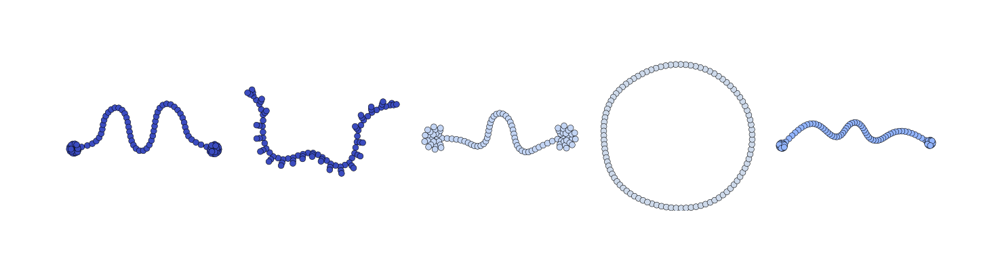

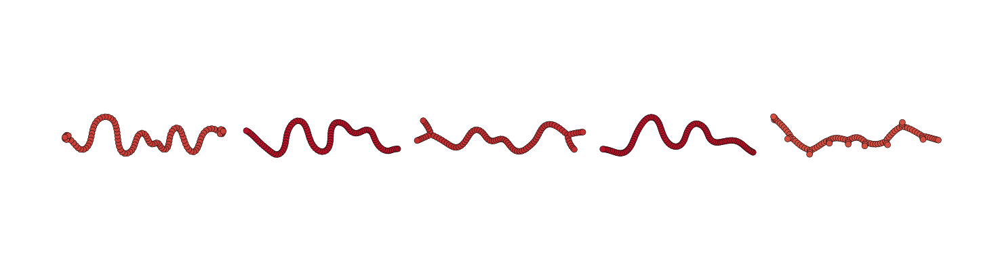

...

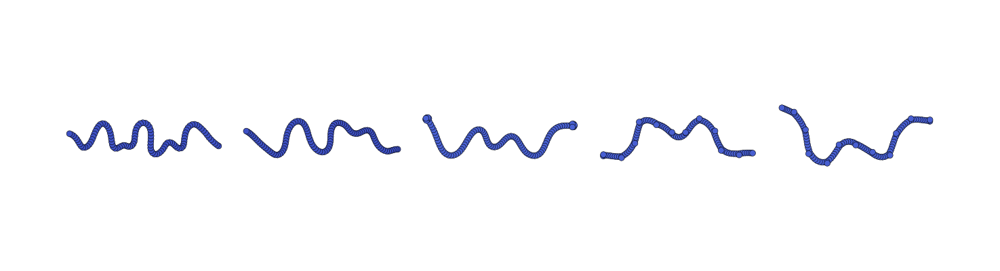

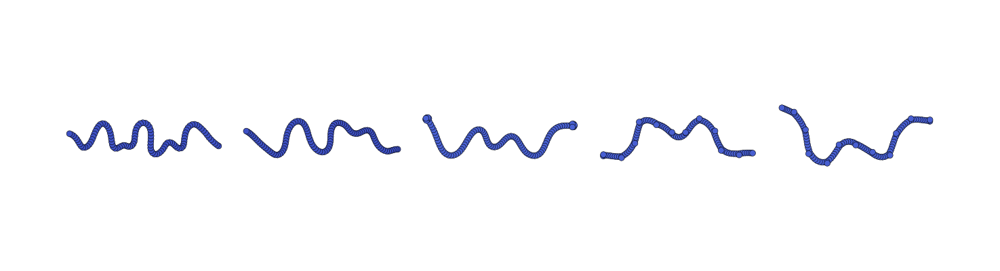

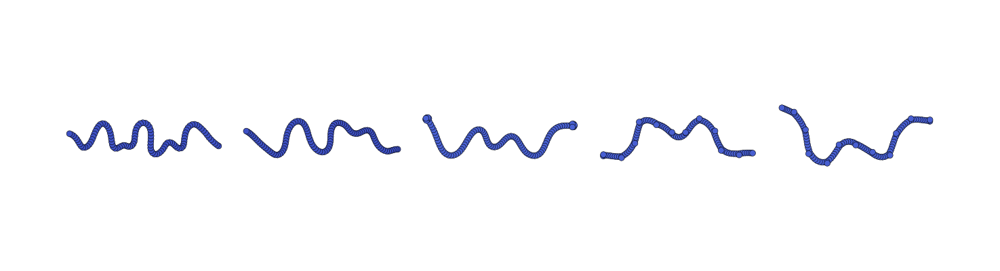

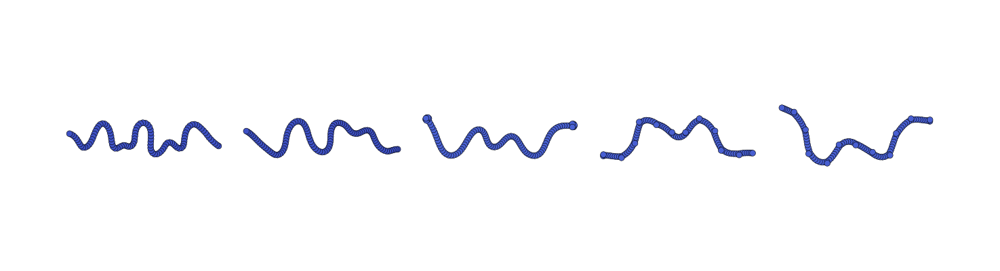

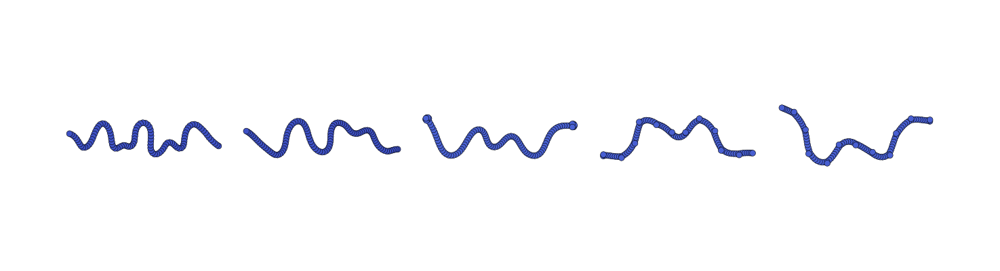

In [8]:
for target_idx in range(30):
    mse_vals  = mse_matrix[target_idx]
    top5_idx  = np.argsort(mse_vals)[:5]

    fig, ax = pplt.subplots(ncols=5, nrows=1, refheight=2, refwidth=2, wspace=-5.5, hspace=0)

    for i in range(5):
        np.random.seed(target_idx * 5 + i + 1)
        g = explored_graphs[top5_idx[i]]
        lam = explored_desc[top5_idx[i]][-1]
        plot_graph(g, ax[i], lam, iteration=100 * (i + 1), lw=0.2, seed=i)

### class-balanced space-filling

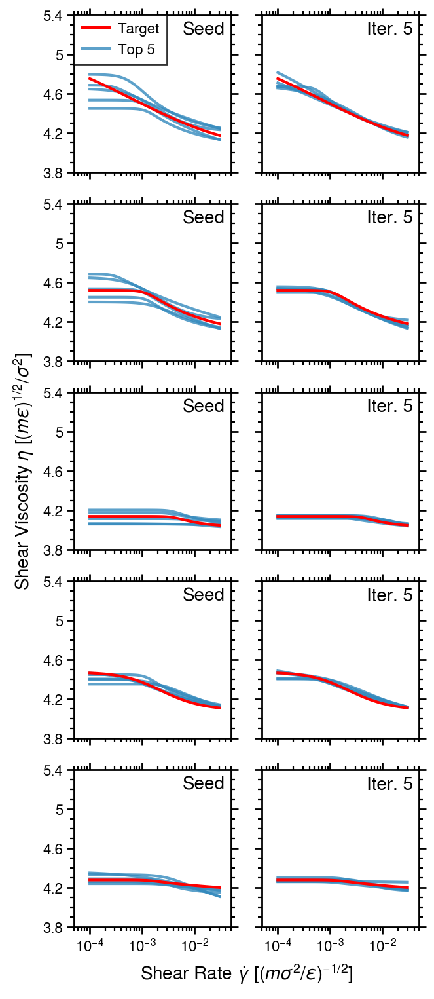

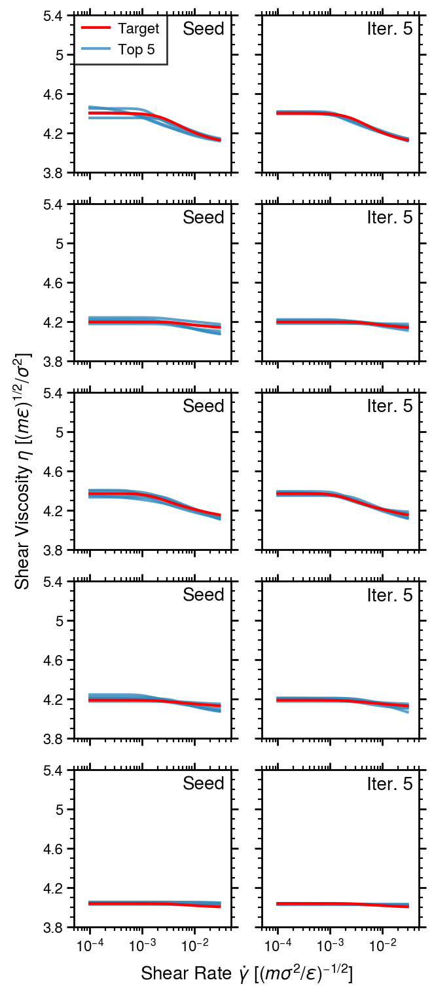

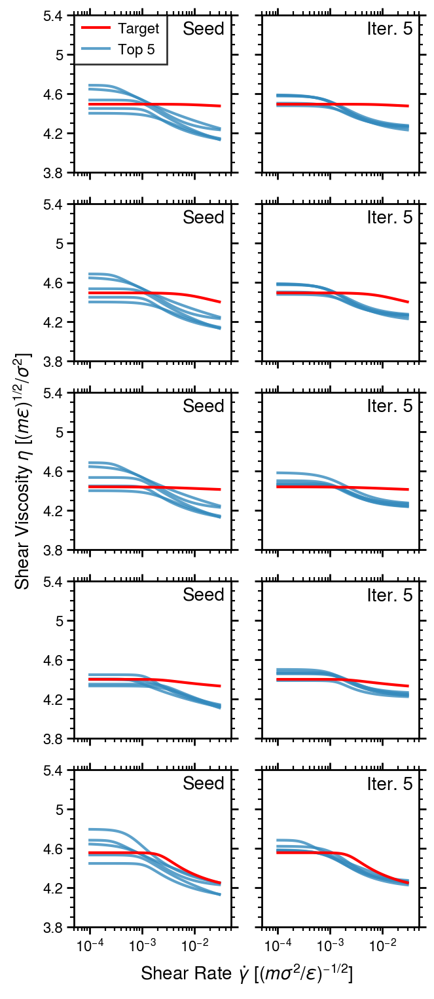

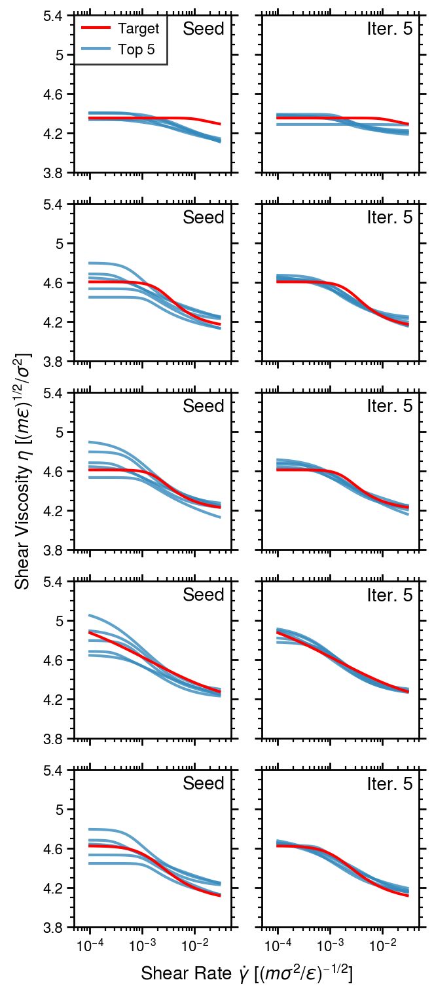

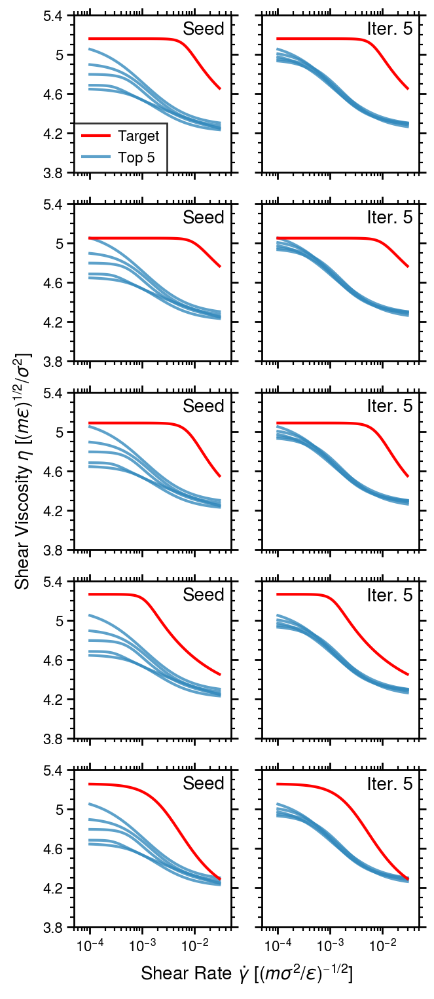

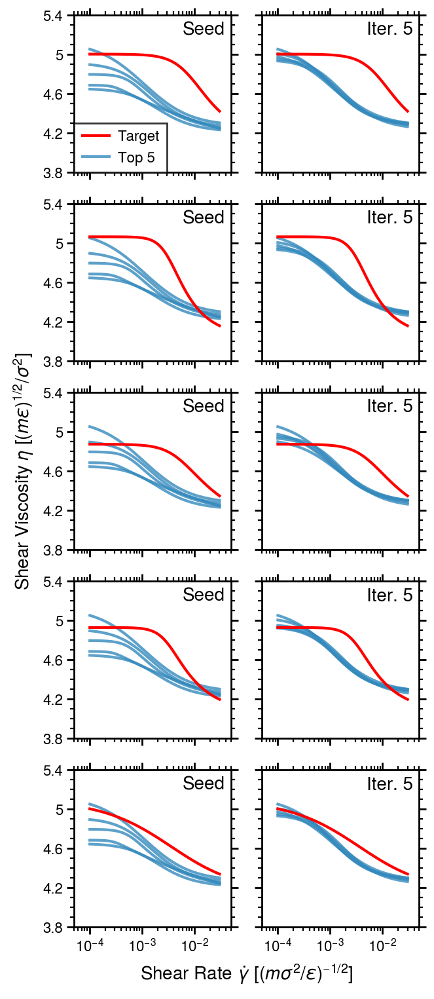

In [9]:
idx_hi, idx_mid, idx_lo, curves, yy, ps = load_target(RESULT_DIR, verbose=False)

desc_all, ps_all, curve_all, shear_rate, graph_all = load_all_fit(RESULT_DIR, rerun=False)

target_indices  = np.concatenate((idx_lo, idx_mid, idx_hi))
target_curves   = curves[target_indices]
explored_curves = np.concatenate((curve_all[:30], curve_all[-450:-300]))
explored_graphs = graph_all[:30] + graph_all[-450:-300]
explored_desc   = np.concatenate((desc_all[:30], desc_all[-450:-300]), axis=0)

mse_matrix = np.mean(np.square(explored_curves[None, :, :] - target_curves[:, None, :]), axis=2)

format_params_update = {
    'xscale': 'log',
    'xlim': [5e-5, 5e-2],
    'ylim': [3.8, 5.4],
    'xticks': [1e-4, 1e-3, 1e-2],
    'yticks': [3.8, 4.2, 4.6, 5.0, 5.4],
    'xticklabels': [r'$10^{-4}$', r'$10^{-3}$', r'$10^{-2}$'],
    'xlabel': r'Shear Rate $\dot{\mathit{\gamma}}~[(\mathit{m}\mathit{\sigma}^2/\mathit{\epsilon})^{-1/2}]$',
    'ylabel': r'Shear Viscosity $\mathit{\eta}~[(\mathit{m}\mathit{\epsilon})^{1/2}/\mathit{\sigma}^2]$',
}

texts = ["Seed", "Iter. 5"]

for group_idx in range(6):
    fig, ax = pplt.subplots(ncols=2, nrows=5, refheight=1.2, share=True, refwidth=1.2)

    for target_idx in range(5):
        curve_idx = group_idx * 5 + target_idx

        for col in range(2):
            errors   = mse_matrix[curve_idx][:30] if col == 0 else mse_matrix[curve_idx]
            top5_idx = np.argsort(errors)[:5]
            plot_idx = col + target_idx * 2

            ax[plot_idx].plot(shear_rate[0], target_curves[curve_idx], 'r', zorder=3, alpha=1, label="Target")

            for j, idx in enumerate(top5_idx):
                alpha = 0.8
                label = "Top 5" if j == 0 else None
                ax[plot_idx].plot(shear_rate[0], explored_curves[idx], COLORS[0], zorder=2, alpha=alpha, label=label)

            ax[plot_idx].format(**format_params_update)
            format_ax(ax[plot_idx])

            if target_idx == 0 and col == 0:
                loc = 'upper left' if explored_curves[top5_idx].max() < 4.8 else "lower left"
                legend = ax[plot_idx].legend(loc=loc, ncols=1, prop={'size': 8})
                legend.get_frame().set_linewidth(1)

            ax[plot_idx].text(0.96, 0.96, texts[col], ha='right', va='top', transform=ax[plot_idx].transAxes, size=10)

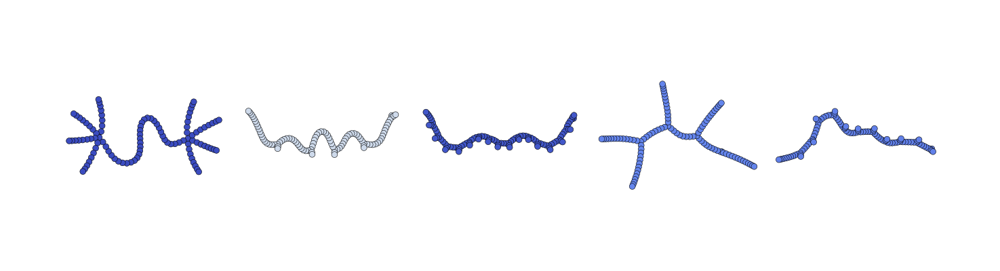

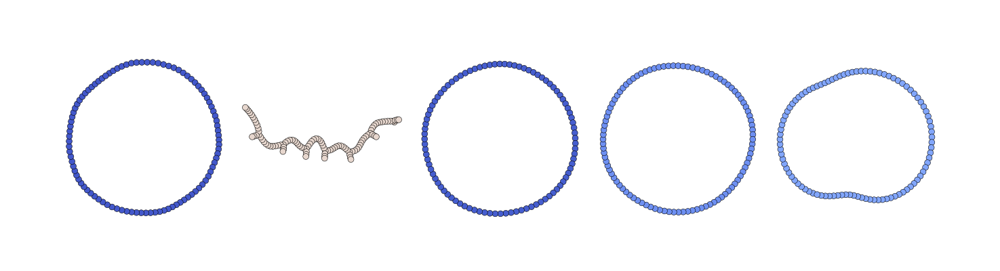

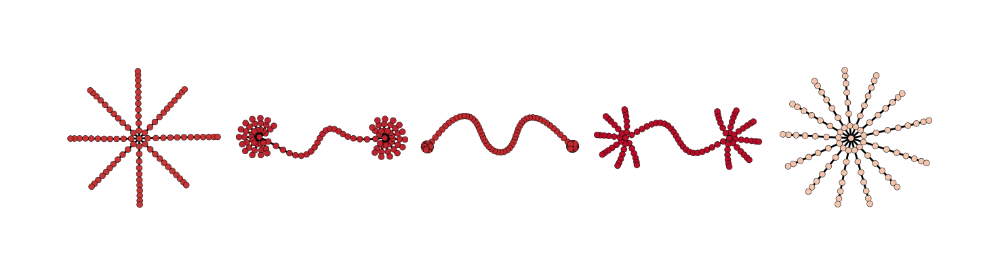

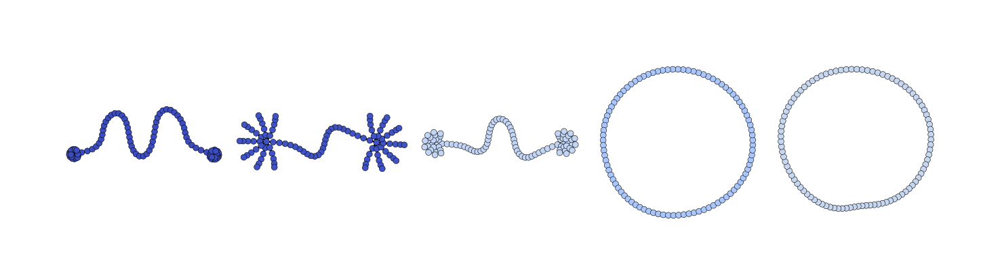

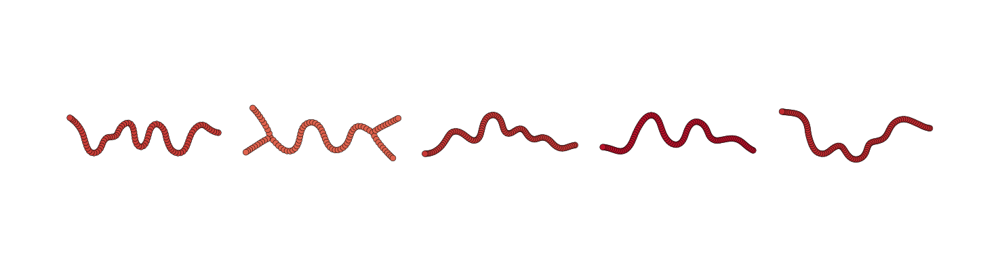

...

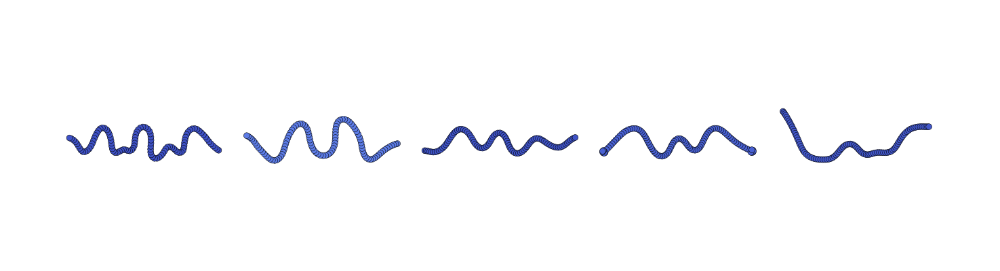

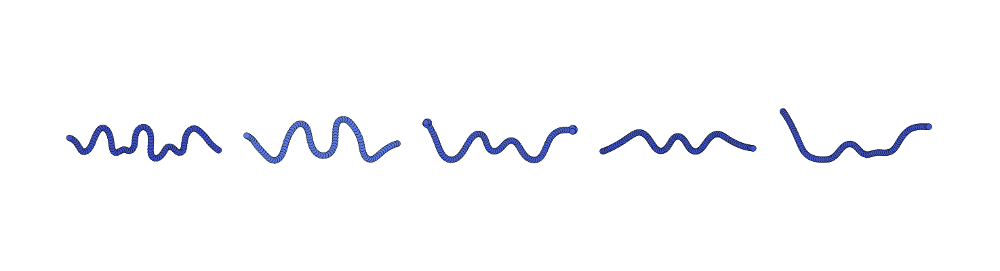

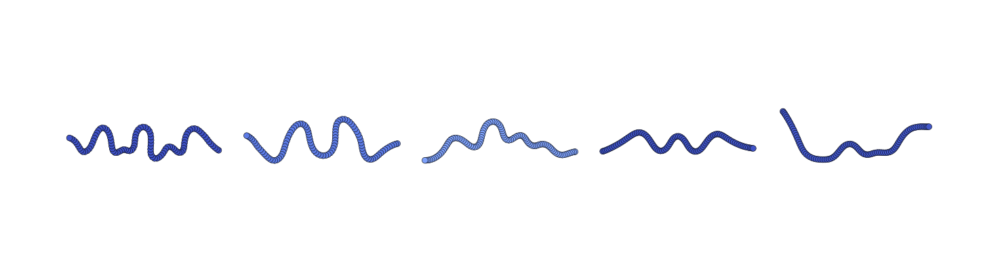

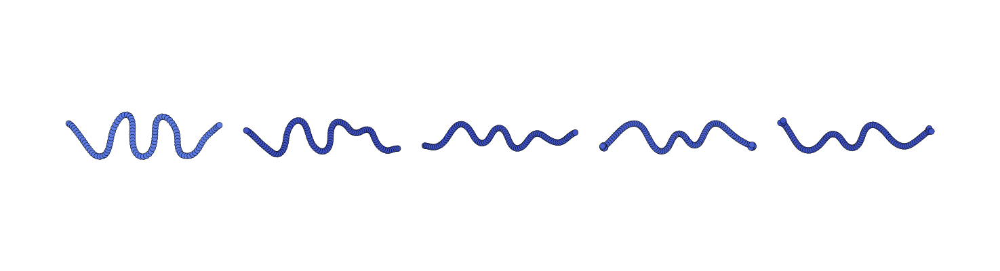

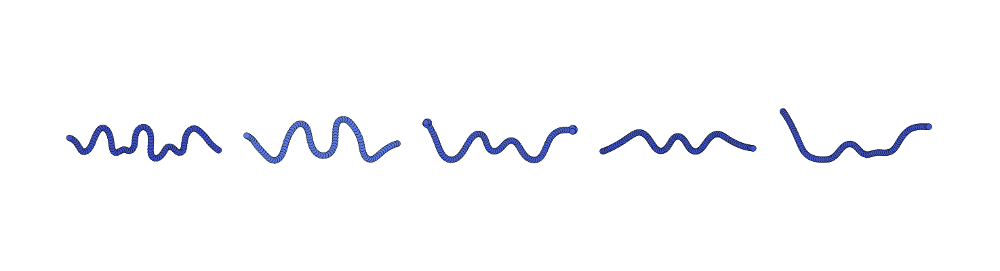

In [10]:
for target_idx in range(30):
    mse_vals  = mse_matrix[target_idx]
    top5_idx  = np.argsort(mse_vals)[:5]

    fig, ax = pplt.subplots(ncols=5, nrows=1, refheight=2, refwidth=2, wspace=-5.5, hspace=0)

    for i in range(5):
        np.random.seed(target_idx * 5 + i + 1)
        g = explored_graphs[top5_idx[i]]
        lam = explored_desc[top5_idx[i]][-1]
        plot_graph(g, ax[i], lam, iteration=100 * (i + 1), lw=0.2, seed=i)